In [2]:
import os
import copy
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms, models

# GPU Check
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if device.type == "cuda":
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")

Using device: cuda
GPU Name: NVIDIA H100 NVL


In [3]:
DIR = "/home/ai21ag3ai05/nas2/plantdataset"
BATCH_SIZE = 512  # High batch size for your 10GB GPU
IMG_SIZE = (224, 224)  # Resize to a standard size for the model

# 1. Define Augmentations (Transforms)
train_transforms = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.RandomAffine(
        degrees=20, 
        translate=(0.2, 0.2), 
        scale=(0.8, 1.2)
    ),
    transforms.RandomHorizontalFlip(p=0.5), # Horizontal flipping
    transforms.ToTensor(),                  # Converts to tensor and scales pixels to [0, 1]
])

test_transforms = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),                  # Only resizing and scaling for Val/Test
])

# 2. Load the base dataset to extract classes and targets
print("Mapping dataset directory...")
base_dataset = datasets.ImageFolder(DIR)
class_names = base_dataset.classes
NUM_CLASSES = len(class_names)
print(f"Found {NUM_CLASSES} classes: {class_names}")

# 3. Create a stratified Train / Valid / Test split
# First split: 80% Train, 20% Temp (which will become Valid and Test)
targets = base_dataset.targets
train_idx, temp_idx = train_test_split(
    range(len(targets)), test_size=0.2, stratify=targets, random_state=42
)

# Second split: Divide the 20% Temp into 10% Valid and 10% Test
temp_targets = [targets[i] for i in temp_idx]
val_idx, test_idx = train_test_split(
    temp_idx, test_size=0.5, stratify=temp_targets, random_state=42
)

print(f"Split sizes -> Train: {len(train_idx)} | Valid: {len(val_idx)} | Test: {len(test_idx)}")

# 4. Apply specific transforms to the subsets
# We instantiate the dataset multiple times so we can attach different transforms
train_dataset = datasets.ImageFolder(DIR, transform=train_transforms)
val_dataset = datasets.ImageFolder(DIR, transform=test_transforms)
test_dataset = datasets.ImageFolder(DIR, transform=test_transforms)

train_subset = Subset(train_dataset, train_idx)
val_subset = Subset(val_dataset, val_idx)
test_subset = Subset(test_dataset, test_idx)

# 5. Create DataLoaders (with pin_memory for faster GPU transfer)
print("\n--- Creating DataLoaders ---")
# Shuffle=True for training
train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)

# Shuffle=False for validation to keep order stable
val_loader = DataLoader(val_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

# Shuffle=False for testing (CRITICAL: Must be False for correct confusion matrix later)
test_loader = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

print("DataLoaders ready.")

Mapping dataset directory...
Found 8 classes: ['Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_healthy']
Split sizes -> Train: 7284 | Valid: 910 | Test: 911

--- Creating DataLoaders ---
DataLoaders ready.



--- Analyzing Dataset Class Distribution ---
Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1076 images
Pepper__bell___Bacterial_spot: 997 images
Pepper__bell___healthy: 1478 images
Potato___Early_blight: 1000 images
Potato___Late_blight: 1000 images
Tomato_Early_blight: 1000 images
Tomato_Late_blight: 963 images
Tomato_healthy: 1591 images


/tmp/ipykernel_2567239/659187348.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts, y=names, palette="viridis")



Saved class distribution chart as 'class_distribution.png'


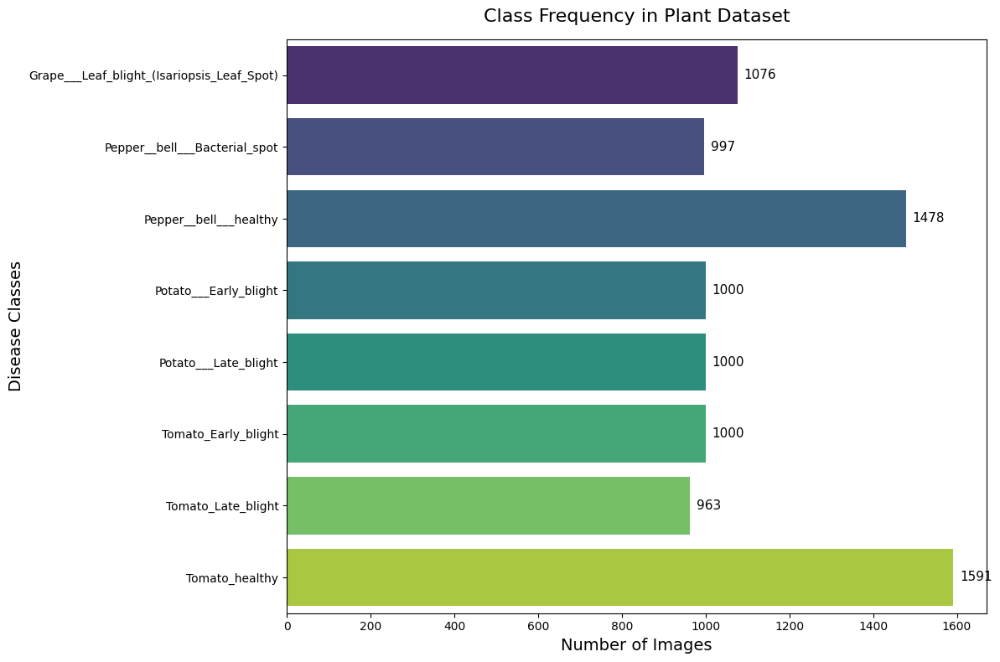

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

print("\n--- Analyzing Dataset Class Distribution ---")

# 1. Count the occurrences of each class in the entire dataset
class_counts = Counter(base_dataset.targets)

# 2. Extract names and their corresponding counts
# We iterate through range(NUM_CLASSES) to keep the order consistent
names = [class_names[i] for i in range(NUM_CLASSES)]
counts = [class_counts[i] for i in range(NUM_CLASSES)]

# 3. Print the exact numbers to the console
for name, count in zip(names, counts):
    print(f"{name}: {count} images")

# 4. Generate the Bar Chart
plt.figure(figsize=(12, 8))

# Using seaborn for a better-looking color palette
sns.barplot(x=counts, y=names, palette="viridis")

# Add chart titles and labels
plt.title("Class Frequency in Plant Dataset", fontsize=16, pad=15)
plt.xlabel("Number of Images", fontsize=14)
plt.ylabel("Disease Classes", fontsize=14)

# Add data labels (the exact count) to the end of each bar
for index, value in enumerate(counts):
    plt.text(value + (max(counts) * 0.01), index, str(value), va='center', fontsize=11)

plt.tight_layout()

# Save the figure (useful for your report/presentation)
plt.savefig("class_distribution.png", dpi=300)
print("\nSaved class distribution chart as 'class_distribution.png'")

# Display the chart
plt.show()

In [5]:
NUM_CLASSES = 8 # Your 8 plant disease classes

# Build EfficientNet-B0 from scratch (NO pre-trained weights)
print("Building EfficientNet-B0 from scratch...")
model = models.efficientnet_b0(weights=None, num_classes=NUM_CLASSES)

# Send the model to the GPU
model = model.to(device)

# Calculate parameters to verify we are training the entire network
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total model parameters: {total_params:,}")
print(f"Trainable model parameters: {trainable_params:,}")

# Both numbers should now be exactly the same, 
# confirming the entire network is ready to learn.

Building EfficientNet-B0 from scratch...


Total model parameters: 4,017,796
Trainable model parameters: 4,017,796


In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import copy
import json

# --- CONFIGURATION ---
EPOCHS = 100
LEARNING_RATE = 1e-4 
PATIENCE = 15
MODEL_SAVE_PATH = "best_efficientnet_plant_disease.pth"
HISTORY_SAVE_PATH = "training_history.json"

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# Mixed Precision Scaler for speed
scaler = torch.amp.GradScaler('cuda')
    
# Tracking dictionaries for plotting
history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

# Early stopping trackers
best_val_loss = float('inf')
patience_counter = 0
best_model_weights = copy.deepcopy(model.state_dict())

print("\nStarting Training Loop...")
for epoch in range(EPOCHS):
    # --- TRAINING PHASE ---
    model.train()
    running_loss, running_corrects, total_samples = 0.0, 0, 0
    
    # Wrap train_loader in tqdm
    train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Train]", leave=False)
    
    for inputs, labels in train_pbar:
        inputs, labels = inputs.to(device), labels.to(device)
        
        optimizer.zero_grad() 
        
        with torch.amp.autocast('cuda'):
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        scaler.step(optimizer)
        scaler.update()
        
        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)
        total_samples += inputs.size(0)
        
        # Update the progress bar with live loss
        train_pbar.set_postfix(loss=f"{loss.item():.4f}")
        
    epoch_loss = running_loss / total_samples
    epoch_acc = (running_corrects.double() / total_samples).item()
    history['loss'].append(epoch_loss)
    history['accuracy'].append(epoch_acc)

    # --- VALIDATION PHASE ---
    model.eval()
    val_loss, val_corrects, val_samples = 0.0, 0, 0
    
    # Wrap val_loader in tqdm
    val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Val]", leave=False)
    
    with torch.no_grad():
        for inputs, labels in val_pbar:
            inputs, labels = inputs.to(device), labels.to(device)
            
            with torch.amp.autocast('cuda'):
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                
            _, preds = torch.max(outputs, 1)
            val_loss += loss.item() * inputs.size(0)
            val_corrects += torch.sum(preds == labels.data)
            val_samples += inputs.size(0)
            
            # Update the validation progress bar with live loss
            val_pbar.set_postfix(loss=f"{loss.item():.4f}")
            
    epoch_val_loss = val_loss / val_samples
    epoch_val_acc = (val_corrects.double() / val_samples).item()
    history['val_loss'].append(epoch_val_loss)
    history['val_accuracy'].append(epoch_val_acc)
    
    # Print the final epoch summary once the progress bars close
    print(f"Epoch {epoch+1}/{EPOCHS} | "
          f"Train Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f} | "
          f"Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")
    
    # --- EARLY STOPPING & SAVING LOGIC ---
    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        best_model_weights = copy.deepcopy(model.state_dict())
        patience_counter = 0
        
        # Save the actual weights to your disk
        torch.save(model.state_dict(), MODEL_SAVE_PATH)
        print(f"--> Validation loss improved. Model saved to {MODEL_SAVE_PATH}")
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print(f"\nEarly stopping triggered at epoch {epoch+1}")
            break

# --- POST-TRAINING TASKS ---

# 1. Load the best weights back into the active model
model.load_state_dict(best_model_weights)
print("\nTraining Complete. Best validation weights restored to active model.")

# 2. Save the training history to a JSON file for later plotting
with open(HISTORY_SAVE_PATH, 'w') as f:
    json.dump(history, f, indent=4)
print(f"Training history successfully saved to {HISTORY_SAVE_PATH}")


Starting Training Loop...


Epoch 1/100 | Train Loss: 2.6495 Acc: 0.1484 | Val Loss: 2.1038 Acc: 0.1099
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 2/100 | Train Loss: 2.2191 Acc: 0.2279 | Val Loss: 2.1378 Acc: 0.1099


Epoch 3/100 | Train Loss: 2.0532 Acc: 0.2854 | Val Loss: 2.1270 Acc: 0.1099


Epoch 4/100 | Train Loss: 1.8336 Acc: 0.3642 | Val Loss: 2.1234 Acc: 0.1099


Epoch 5/100 | Train Loss: 1.6258 Acc: 0.4233 | Val Loss: 1.9221 Acc: 0.2044
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 6/100 | Train Loss: 1.5726 Acc: 0.4596 | Val Loss: 1.5157 Acc: 0.4242
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 7/100 | Train Loss: 1.4564 Acc: 0.5065 | Val Loss: 1.1824 Acc: 0.6011
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 8/100 | Train Loss: 1.2626 Acc: 0.5439 | Val Loss: 1.0815 Acc: 0.6011
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 9/100 | Train Loss: 1.1745 Acc: 0.5988 | Val Loss: 0.9072 Acc: 0.6582
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 10/100 | Train Loss: 1.1003 Acc: 0.6411 | Val Loss: 1.2360 Acc: 0.6934


Epoch 11/100 | Train Loss: 0.9834 Acc: 0.6726 | Val Loss: 0.7477 Acc: 0.7198
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 12/100 | Train Loss: 0.9069 Acc: 0.6995 | Val Loss: 0.6703 Acc: 0.7473
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 13/100 | Train Loss: 0.8370 Acc: 0.7155 | Val Loss: 0.6242 Acc: 0.7846
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 14/100 | Train Loss: 0.8122 Acc: 0.7400 | Val Loss: 0.5303 Acc: 0.8088
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 15/100 | Train Loss: 0.7066 Acc: 0.7586 | Val Loss: 0.5275 Acc: 0.8077
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 16/100 | Train Loss: 0.6908 Acc: 0.7657 | Val Loss: 0.5218 Acc: 0.8110
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 17/100 | Train Loss: 0.6531 Acc: 0.7798 | Val Loss: 0.4664 Acc: 0.8374
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 18/100 | Train Loss: 0.6114 Acc: 0.8002 | Val Loss: 0.4320 Acc: 0.8451
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 19/100 | Train Loss: 0.5582 Acc: 0.8134 | Val Loss: 0.4501 Acc: 0.8308


Epoch 20/100 | Train Loss: 0.5364 Acc: 0.8189 | Val Loss: 0.3595 Acc: 0.8703
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 21/100 | Train Loss: 0.5698 Acc: 0.8203 | Val Loss: 0.6632 Acc: 0.8648


Epoch 22/100 | Train Loss: 0.4809 Acc: 0.8337 | Val Loss: 0.3644 Acc: 0.8692


Epoch 23/100 | Train Loss: 0.4893 Acc: 0.8413 | Val Loss: 0.3282 Acc: 0.8945
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 24/100 | Train Loss: 0.4674 Acc: 0.8447 | Val Loss: 0.3146 Acc: 0.8857
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 25/100 | Train Loss: 0.4315 Acc: 0.8513 | Val Loss: 0.3063 Acc: 0.8923
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 26/100 | Train Loss: 0.4246 Acc: 0.8645 | Val Loss: 0.2602 Acc: 0.9011
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 27/100 | Train Loss: 0.4159 Acc: 0.8616 | Val Loss: 0.2721 Acc: 0.9022


Epoch 28/100 | Train Loss: 0.4175 Acc: 0.8688 | Val Loss: 0.2569 Acc: 0.9121
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 29/100 | Train Loss: 0.3969 Acc: 0.8738 | Val Loss: 0.2471 Acc: 0.9044
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 30/100 | Train Loss: 0.3407 Acc: 0.8854 | Val Loss: 0.2288 Acc: 0.9253
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 31/100 | Train Loss: 0.3197 Acc: 0.8907 | Val Loss: 0.2181 Acc: 0.9275
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 32/100 | Train Loss: 0.3357 Acc: 0.8878 | Val Loss: 0.2399 Acc: 0.9242


Epoch 33/100 | Train Loss: 0.3240 Acc: 0.8961 | Val Loss: 0.2749 Acc: 0.9000


Epoch 34/100 | Train Loss: 0.2957 Acc: 0.8961 | Val Loss: 0.2169 Acc: 0.9198
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 35/100 | Train Loss: 0.2883 Acc: 0.9032 | Val Loss: 0.1881 Acc: 0.9330
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 36/100 | Train Loss: 0.2656 Acc: 0.9174 | Val Loss: 0.1866 Acc: 0.9352
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 37/100 | Train Loss: 0.2403 Acc: 0.9187 | Val Loss: 0.2018 Acc: 0.9330


Epoch 38/100 | Train Loss: 0.2543 Acc: 0.9163 | Val Loss: 0.2117 Acc: 0.9352


Epoch 39/100 | Train Loss: 0.2283 Acc: 0.9245 | Val Loss: 0.1496 Acc: 0.9407
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 40/100 | Train Loss: 0.2126 Acc: 0.9223 | Val Loss: 0.1620 Acc: 0.9385


Epoch 41/100 | Train Loss: 0.2074 Acc: 0.9266 | Val Loss: 0.1430 Acc: 0.9418
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 42/100 | Train Loss: 0.2158 Acc: 0.9261 | Val Loss: 0.1633 Acc: 0.9429


Epoch 43/100 | Train Loss: 0.2177 Acc: 0.9330 | Val Loss: 0.1501 Acc: 0.9505


Epoch 44/100 | Train Loss: 0.2057 Acc: 0.9379 | Val Loss: 0.1855 Acc: 0.9374


Epoch 45/100 | Train Loss: 0.1814 Acc: 0.9406 | Val Loss: 0.1029 Acc: 0.9681
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 46/100 | Train Loss: 0.1856 Acc: 0.9408 | Val Loss: 0.2299 Acc: 0.9615


Epoch 47/100 | Train Loss: 0.1674 Acc: 0.9445 | Val Loss: 0.1709 Acc: 0.9451


Epoch 48/100 | Train Loss: 0.1653 Acc: 0.9428 | Val Loss: 0.1297 Acc: 0.9527


Epoch 49/100 | Train Loss: 0.1629 Acc: 0.9466 | Val Loss: 0.1328 Acc: 0.9560


Epoch 50/100 | Train Loss: 0.1599 Acc: 0.9517 | Val Loss: 0.1014 Acc: 0.9593
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 51/100 | Train Loss: 0.1439 Acc: 0.9484 | Val Loss: 0.1240 Acc: 0.9571


Epoch 52/100 | Train Loss: 0.1440 Acc: 0.9511 | Val Loss: 0.0823 Acc: 0.9670
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 53/100 | Train Loss: 0.1252 Acc: 0.9562 | Val Loss: 0.0938 Acc: 0.9637


Epoch 54/100 | Train Loss: 0.1333 Acc: 0.9533 | Val Loss: 0.0759 Acc: 0.9670
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 55/100 | Train Loss: 0.1199 Acc: 0.9611 | Val Loss: 0.0722 Acc: 0.9714
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 56/100 | Train Loss: 0.1265 Acc: 0.9570 | Val Loss: 0.0583 Acc: 0.9769
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 57/100 | Train Loss: 0.1412 Acc: 0.9590 | Val Loss: 0.0619 Acc: 0.9736


Epoch 58/100 | Train Loss: 0.1095 Acc: 0.9602 | Val Loss: 0.1375 Acc: 0.9593


Epoch 59/100 | Train Loss: 0.1111 Acc: 0.9611 | Val Loss: 0.0743 Acc: 0.9725


Epoch 60/100 | Train Loss: 0.1016 Acc: 0.9640 | Val Loss: 0.1264 Acc: 0.9615


Epoch 61/100 | Train Loss: 0.1037 Acc: 0.9639 | Val Loss: 0.0643 Acc: 0.9791


Epoch 62/100 | Train Loss: 0.0957 Acc: 0.9680 | Val Loss: 0.0780 Acc: 0.9758


Epoch 63/100 | Train Loss: 0.0949 Acc: 0.9699 | Val Loss: 0.0600 Acc: 0.9780


Epoch 64/100 | Train Loss: 0.1015 Acc: 0.9684 | Val Loss: 0.0757 Acc: 0.9747


Epoch 65/100 | Train Loss: 0.0979 Acc: 0.9669 | Val Loss: 0.0835 Acc: 0.9736


Epoch 66/100 | Train Loss: 0.0853 Acc: 0.9713 | Val Loss: 0.0545 Acc: 0.9857
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 67/100 | Train Loss: 0.0854 Acc: 0.9699 | Val Loss: 0.0689 Acc: 0.9736


Epoch 68/100 | Train Loss: 0.0835 Acc: 0.9705 | Val Loss: 0.0905 Acc: 0.9703


Epoch 69/100 | Train Loss: 0.0824 Acc: 0.9728 | Val Loss: 0.0517 Acc: 0.9802
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 70/100 | Train Loss: 0.0646 Acc: 0.9789 | Val Loss: 0.0679 Acc: 0.9769


Epoch 71/100 | Train Loss: 0.0932 Acc: 0.9705 | Val Loss: 0.0518 Acc: 0.9835


Epoch 72/100 | Train Loss: 0.0628 Acc: 0.9778 | Val Loss: 0.0722 Acc: 0.9758


Epoch 73/100 | Train Loss: 0.0758 Acc: 0.9761 | Val Loss: 0.0647 Acc: 0.9835


Epoch 74/100 | Train Loss: 0.0783 Acc: 0.9745 | Val Loss: 0.0560 Acc: 0.9813


Epoch 75/100 | Train Loss: 0.0803 Acc: 0.9739 | Val Loss: 0.0379 Acc: 0.9868
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 76/100 | Train Loss: 0.0688 Acc: 0.9776 | Val Loss: 0.0694 Acc: 0.9813


Epoch 77/100 | Train Loss: 0.0599 Acc: 0.9784 | Val Loss: 0.1000 Acc: 0.9736


Epoch 78/100 | Train Loss: 0.0597 Acc: 0.9811 | Val Loss: 0.0716 Acc: 0.9769


Epoch 79/100 | Train Loss: 0.0728 Acc: 0.9741 | Val Loss: 0.0444 Acc: 0.9857


Epoch 80/100 | Train Loss: 0.0587 Acc: 0.9808 | Val Loss: 0.0620 Acc: 0.9824


Epoch 81/100 | Train Loss: 0.0760 Acc: 0.9798 | Val Loss: 0.0989 Acc: 0.9780


Epoch 82/100 | Train Loss: 0.0715 Acc: 0.9811 | Val Loss: 0.0601 Acc: 0.9879


Epoch 83/100 | Train Loss: 0.0596 Acc: 0.9798 | Val Loss: 0.0514 Acc: 0.9857


Epoch 84/100 | Train Loss: 0.0596 Acc: 0.9805 | Val Loss: 0.0696 Acc: 0.9802


Epoch 85/100 | Train Loss: 0.0527 Acc: 0.9834 | Val Loss: 0.0796 Acc: 0.9802


Epoch 86/100 | Train Loss: 0.0571 Acc: 0.9794 | Val Loss: 0.0425 Acc: 0.9868


Epoch 87/100 | Train Loss: 0.0582 Acc: 0.9805 | Val Loss: 0.0401 Acc: 0.9868


Epoch 88/100 | Train Loss: 0.0646 Acc: 0.9837 | Val Loss: 0.1113 Acc: 0.9692


Epoch 89/100 | Train Loss: 0.0456 Acc: 0.9857 | Val Loss: 0.0417 Acc: 0.9879


Epoch 90/100 | Train Loss: 0.0458 Acc: 0.9842 | Val Loss: 0.0345 Acc: 0.9846
--> Validation loss improved. Model saved to best_efficientnet_plant_disease.pth


Epoch 91/100 | Train Loss: 0.0429 Acc: 0.9861 | Val Loss: 0.0410 Acc: 0.9846


Epoch 92/100 | Train Loss: 0.0452 Acc: 0.9833 | Val Loss: 0.0492 Acc: 0.9846


Epoch 93/100 | Train Loss: 0.0437 Acc: 0.9856 | Val Loss: 0.0399 Acc: 0.9879


Epoch 94/100 | Train Loss: 0.0482 Acc: 0.9848 | Val Loss: 0.0579 Acc: 0.9813


Epoch 95/100 | Train Loss: 0.0556 Acc: 0.9850 | Val Loss: 0.0397 Acc: 0.9857


Epoch 96/100 | Train Loss: 0.0482 Acc: 0.9849 | Val Loss: 0.0531 Acc: 0.9824


Epoch 97/100 | Train Loss: 0.0421 Acc: 0.9849 | Val Loss: 0.0600 Acc: 0.9857


Epoch 98/100 | Train Loss: 0.0411 Acc: 0.9856 | Val Loss: 0.0596 Acc: 0.9824


Epoch 99/100 | Train Loss: 0.0403 Acc: 0.9861 | Val Loss: 0.0644 Acc: 0.9824


Epoch 100/100 | Train Loss: 0.0397 Acc: 0.9886 | Val Loss: 0.0418 Acc: 0.9879

Training Complete. Best validation weights restored to active model.
Training history successfully saved to training_history.json


In [7]:
# 1. Build the exact same architecture
model = models.efficientnet_b0(weights=None)
num_ftrs = model.classifier[1].in_features
model.classifier[1] = nn.Linear(num_ftrs, NUM_CLASSES)

# 2. Load the saved weights
model.load_state_dict(torch.load("best_efficientnet_plant_disease.pth"))
model = model.to(device)
model.eval() # Set to evaluation mode

/tmp/ipykernel_2567239/2573048601.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("best_efficientnet_plant_disease.pth"))


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

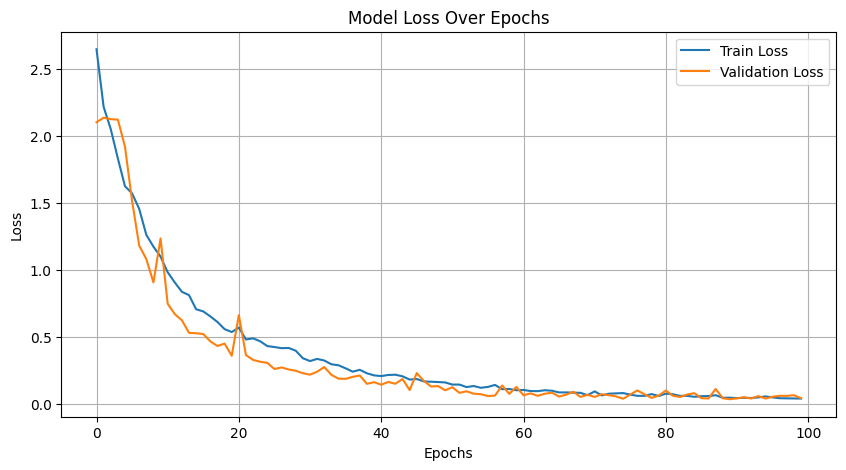

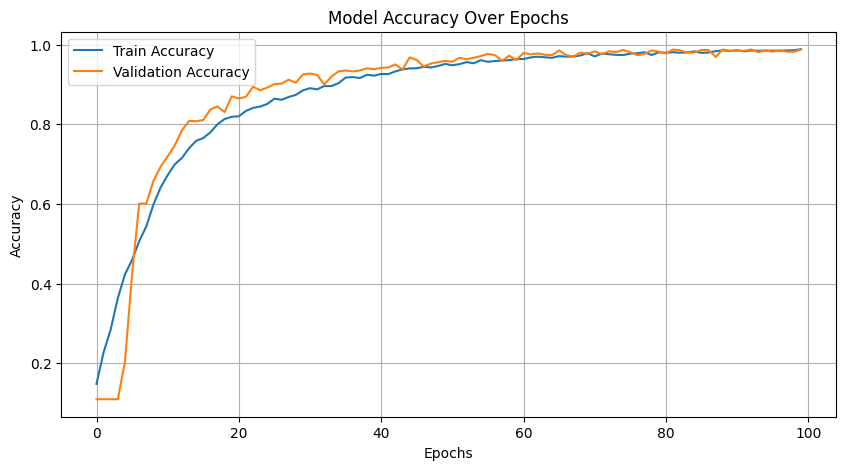

In [10]:
import matplotlib.pyplot as plt
import json
# 1. Load the history from the file
with open("training_history.json", 'r') as f:
    loaded_history = json.load(f)

# 2. Plotting Example (Loss)
plt.figure(figsize=(10, 5))
plt.plot(loaded_history['loss'], label='Train Loss')
plt.plot(loaded_history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# 3. Plotting Example (Accuracy)
plt.figure(figsize=(10, 5))
plt.plot(loaded_history['accuracy'], label='Train Accuracy')
plt.plot(loaded_history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

In [1]:
import json
import numpy as np

HISTORY_SAVE_PATH = "training_history.json"

try:
    # Load the tracked history
    with open(HISTORY_SAVE_PATH, 'r') as f:
        history = json.load(f)

    # Find the index of the absolute lowest validation loss
    best_epoch_idx = np.argmin(history['val_loss'])

    # Extract the corresponding stats for that epoch
    best_val_loss = history['val_loss'][best_epoch_idx]
    best_val_acc = history['val_accuracy'][best_epoch_idx]
    best_train_loss = history['loss'][best_epoch_idx]
    best_train_acc = history['accuracy'][best_epoch_idx]

    # Print it out nicely
    print("\n" + "="*50)
    print(f" 🏆 BEST MODEL STATS (Saved at Epoch {best_epoch_idx + 1}) 🏆")
    print("="*50)
    print(f" Training Loss:       {best_train_loss:.4f}")
    print(f" Training Accuracy:   {best_train_acc:.4f}")
    print(f" Validation Loss:     {best_val_loss:.4f}")
    print(f" Validation Accuracy: {best_val_acc:.4f}")
    print("="*50 + "\n")

except FileNotFoundError:
    print(f"Error: Could not find '{HISTORY_SAVE_PATH}'. Make sure you are running this in the same directory where your model was trained!")


 🏆 BEST MODEL STATS (Saved at Epoch 90) 🏆
 Training Loss:       0.0458
 Training Accuracy:   0.9842
 Validation Loss:     0.0345
 Validation Accuracy: 0.9846



Generating predictions for confusion matrix...


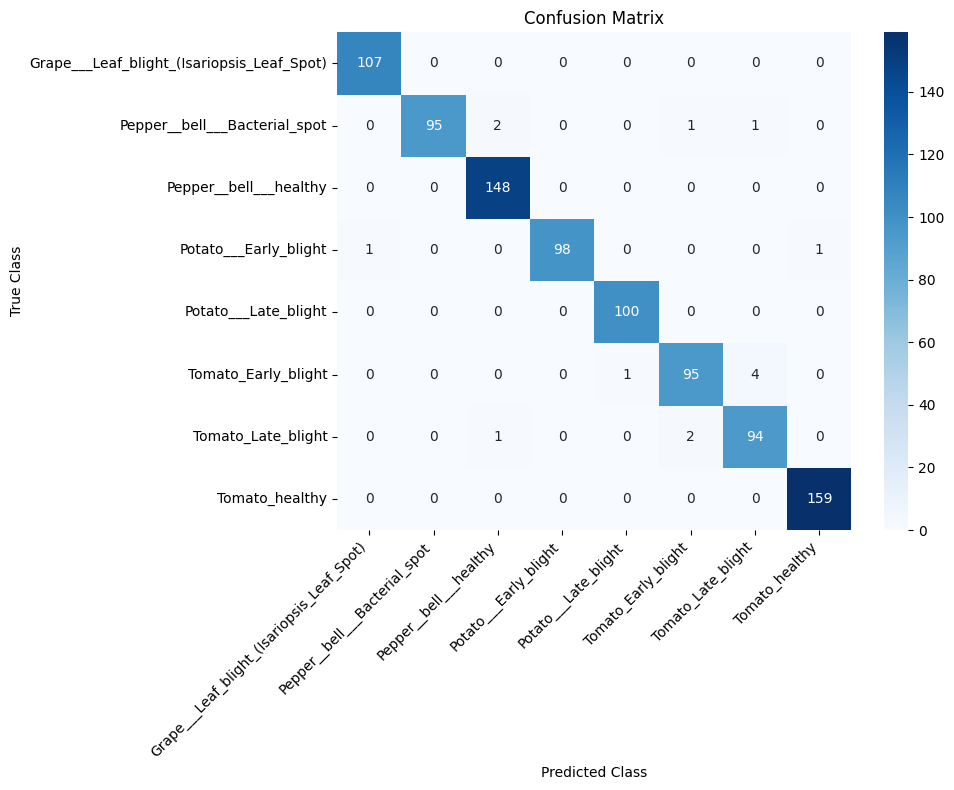


Classification Report:

                                            precision    recall  f1-score   support

Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.99      1.00      1.00       107
             Pepper__bell___Bacterial_spot       1.00      0.96      0.98        99
                    Pepper__bell___healthy       0.98      1.00      0.99       148
                     Potato___Early_blight       1.00      0.98      0.99       100
                      Potato___Late_blight       0.99      1.00      1.00       100
                       Tomato_Early_blight       0.97      0.95      0.96       100
                        Tomato_Late_blight       0.95      0.97      0.96        97
                            Tomato_healthy       0.99      1.00      1.00       159

                                  accuracy                           0.98       910
                                 macro avg       0.98      0.98      0.98       910
                              weighted avg       

In [11]:
y_true = []
y_pred = []

model.eval()
print("Generating predictions for confusion matrix...")
with torch.no_grad():
    for inputs, labels in val_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        
        y_true.extend(labels.numpy())
        y_pred.extend(preds.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names)
plt.title('Confusion Matrix')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Print detailed classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

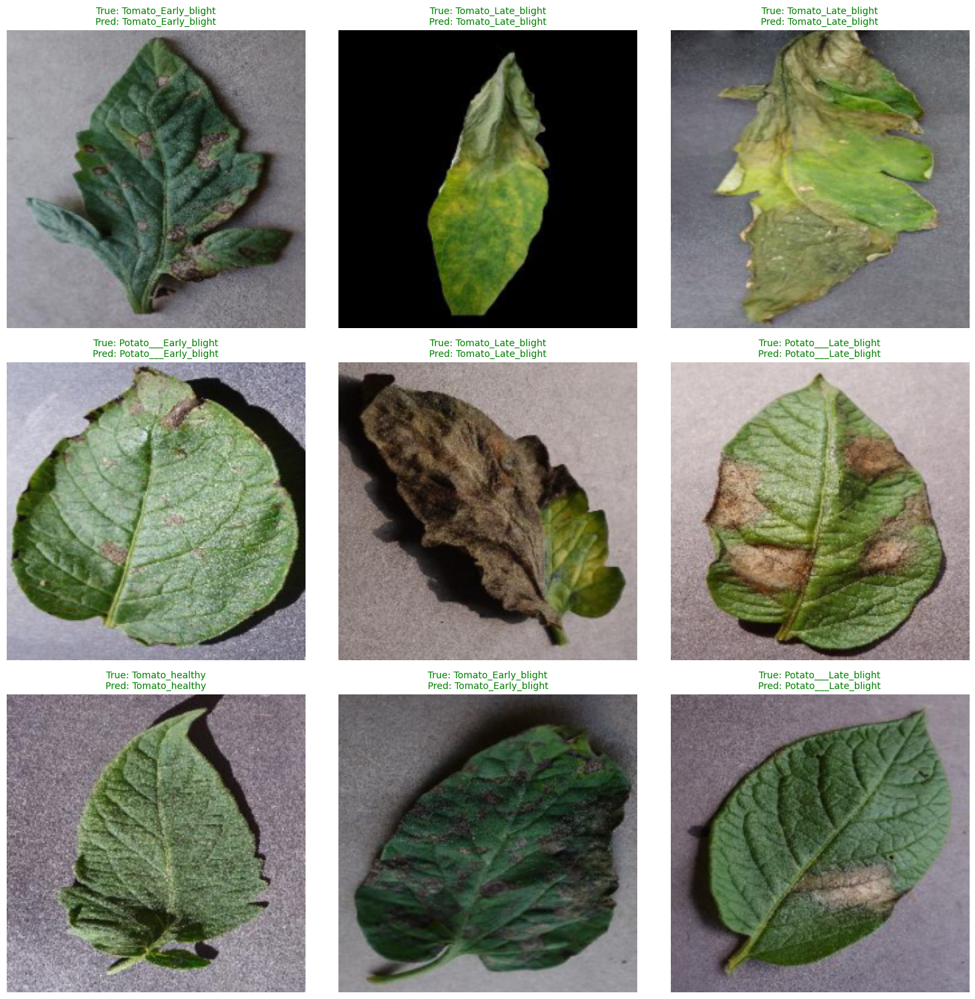

In [12]:
# Grab a single batch from the validation loader
inputs, labels = next(iter(val_loader))
inputs_gpu = inputs.to(device)

# Get predictions
model.eval()
with torch.no_grad():
    outputs = model(inputs_gpu)
    _, preds = torch.max(outputs, 1)

# Move tensors back to CPU for visualization
sample_images = inputs.numpy()
sample_labels = labels.numpy()
batch_pred_labels = preds.cpu().numpy()

plt.figure(figsize=(15, 15))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    
    # PyTorch images are (C, H, W). Matplotlib needs (H, W, C).
    img = np.transpose(sample_images[i], (1, 2, 0))
    plt.imshow(img)
    
    true_label = class_names[sample_labels[i]]
    pred_label = class_names[batch_pred_labels[i]]
    
    # Color title green if correct, red if incorrect
    color = "green" if true_label == pred_label else "red"
    
    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color, fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()

Hunting for 10 samples from Potato Late Blight and Grape Leaf Blight...
All required samples found! Generating grid...


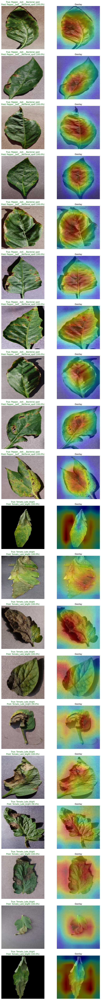

In [14]:
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import torch

# --- 1. Grad-CAM Class Definition (Unchanged) ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        
        def forward_hook(module, input, output):
            self.activations = output
            output.register_hook(self.backward_hook)
            
        self.target_layer.register_forward_hook(forward_hook)

    def backward_hook(self, grad):
        self.gradients = grad

    def generate(self, input_tensor, target_class=None):
        self.model.eval()
        input_tensor.requires_grad_(True)
        output = self.model(input_tensor)
        
        if target_class is None:
            target_class = torch.argmax(output, dim=1).item()
            
        self.model.zero_grad()
        class_score = output[0, target_class]
        class_score.backward(retain_graph=True)
        
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])
        activations = self.activations.squeeze(0)
        for i in range(activations.shape[0]):
            activations[i, :, :] *= pooled_gradients[i]
            
        heatmap = torch.mean(activations, dim=0).cpu()
        heatmap = torch.relu(heatmap) 
        
        if torch.max(heatmap) != 0:
            heatmap /= torch.max(heatmap)
            
        heatmap = heatmap.unsqueeze(0).unsqueeze(0)
        heatmap = F.interpolate(heatmap, size=(IMG_SIZE[0], IMG_SIZE[1]), mode='bilinear', align_corners=False)
        heatmap = heatmap.squeeze().detach().numpy() 
        
        return heatmap, target_class, output

# --- 2. Hunt for 10 Images per Target Class ---
# Set these to the actual indices in your class_names list
POTATO_IDX = 1  # Example index
GRAPE_IDX = 6   # Example index
TARGET_CLASSES = [POTATO_IDX, GRAPE_IDX]
SAMPLES_PER_CLASS = 10

print(f"Hunting for {SAMPLES_PER_CLASS} samples from Potato Late Blight and Grape Leaf Blight...")
cam = GradCAM(model, model.features[-1])

# Storing: {class_idx: [(original, overlay, pred_idx, confidence), ...]}
visualizations = {cls_idx: [] for cls_idx in TARGET_CLASSES}

for inputs, labels in val_loader:
    for i in range(inputs.size(0)):
        true_label_idx = labels[i].item()
        
        # Check if it's a target class and we need more samples
        if true_label_idx in TARGET_CLASSES and len(visualizations[true_label_idx]) < SAMPLES_PER_CLASS:
            input_tensor = inputs[i].unsqueeze(0).to(device)
            
            heatmap, pred_label_idx, output = cam.generate(input_tensor)
            
            probabilities = F.softmax(output, dim=1)
            confidence = probabilities[0, pred_label_idx].item()
            
            original_img = inputs[i].numpy().transpose(1, 2, 0)
            cmap = plt.get_cmap('jet')
            heatmap_colored = cmap(heatmap)[..., :3] 
            overlay = heatmap_colored * 0.4 + original_img * 0.6
            overlay = np.clip(overlay, 0, 1) 
            
            visualizations[true_label_idx].append((original_img, overlay, pred_label_idx, confidence))
            
    # Break early if we have 10 of both
    if all(len(v) == SAMPLES_PER_CLASS for v in visualizations.values()):
        break
if all(len(v) == SAMPLES_PER_CLASS for v in visualizations.values()):
    print("All required samples found! Generating grid...")

# --- 3. Plotting the Grid (Original | Overlay) ---
# Total rows = 20 (10 for potato, 10 for grape). 2 columns.
total_rows = SAMPLES_PER_CLASS * len(TARGET_CLASSES)
fig, axes = plt.subplots(total_rows, 2, figsize=(10, 4 * total_rows))

row = 0
for class_idx in TARGET_CLASSES:
    true_name = class_names[class_idx]
    
    for item in visualizations[class_idx]:
        original_img, overlay, pred_label_idx, confidence = item
        pred_name = class_names[pred_label_idx]
        color = "green" if class_idx == pred_label_idx else "red"
        
        # Original Image
        ax = axes[row, 0]
        ax.imshow(original_img)
        ax.set_title(f"True: {true_name}\nPred: {pred_name} ({confidence:.1%})", color=color, fontsize=11)
        ax.axis('off')
        
        # Overlay
        ax = axes[row, 1]
        ax.imshow(overlay)
        ax.set_title(f"Overlay", fontsize=11)
        ax.axis('off')
        
        row += 1

plt.tight_layout()
plt.show()